# Data Dictionary

**1) anime_data:**

`anime_id` - unique id identifying an anime.

`name` - full name of anime.

`genre` - comma separated list of genres for this anime.

`type` - movie, TV, OVA, etc.

`episodes` - how many episodes in this show. (1 if movie).

`rating` - average rating out of 10 for this anime.

`members` - number of community members that are in this anime's "group".

**2) rating_data:**

`user_id` - non identifiable randomly generated user id.

`anime_id` - the anime that this user has rated.

`rating` - rating out of 10 this user has assigned (-1 if the user watched it but didn't assign a rating).

#Import Libraries <a id='import_lib'></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import 'Pandas' 
import pandas as pd 

# import 'Numpy' 
import numpy as np

# import subpackage of Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

from ast import literal_eval
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, linear_kernel
!pip install surprise
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate
from sklearn.decomposition import TruncatedSVD
import re
import string

#Setting some useful Default Options <a id='set_options'></a>

In [ ]:
# display all columns of the dataframe
pd.options.display.max_columns = None
# display all rows of the dataframe
pd.options.display.max_rows = None
# return an output value upto 6 decimals
pd.options.display.float_format = '{:.6f}'.format

#Reading the Data <a id='Read_Data'></a>

In [ ]:
anime=pd.read_csv('/content/drive/MyDrive/anime.csv')
anime.head()

,anime_id,name,genre,type,episodes,rating,members
0,32281,Kimi no Na wa.,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630
1,5114,Fullmetal Alchemist: Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",TV,64,9.260000,793665
2,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.250000,114262
3,9253,Steins;Gate,"Sci-Fi, Thriller",TV,24,9.170000,673572
4,9969,Gintama&#039;,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.160000,151266


In [ ]:
anime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12294 entries, 0 to 12293
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   anime_id  12294 non-null  int64  
 1   name      12294 non-null  object 
 2   genre     12232 non-null  object 
 3   type      12269 non-null  object 
 4   episodes  12294 non-null  object 
 5   rating    12064 non-null  float64
 6   members   12294 non-null  int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 672.5+ KB


In [ ]:
rating=pd.read_csv('/content/drive/MyDrive/rating.csv',sep=',')
rating.head()

,user_id,anime_id,rating
0,1,20,-1
1,1,24,-1
2,1,79,-1
3,1,226,-1
4,1,241,-1


In [ ]:
rating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7813737 entries, 0 to 7813736
Data columns (total 3 columns):
 #   Column    Dtype
---  ------    -----
 0   user_id   int64
 1   anime_id  int64
 2   rating    int64
dtypes: int64(3)
memory usage: 178.8 MB


#Exploratory Data Analysis <a id='data_preparation'></a>

##Preparing the Dataset <a id='Data_Preparing'></a>

###Dataset Cleaning <a id='data_cleaning'></a>

In [ ]:
anime['name'].unique()[3:10]

array(['Steins;Gate', 'Gintama&#039;',
       'Haikyuu!!: Karasuno Koukou VS Shiratorizawa Gakuen Koukou',
       'Hunter x Hunter (2011)', 'Ginga Eiyuu Densetsu',
       'Gintama Movie: Kanketsu-hen - Yorozuya yo Eien Nare',
       'Gintama&#039;: Enchousen'], dtype=object)

In [ ]:
def text_cleaning(text):
    text = re.sub(r'&quot;', '', text)
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub(r'.hack//', '', text)
    text = re.sub(r'&#039;', '', text)
    text = re.sub(r'A&#039;s', '', text)
    text = re.sub(r'I&#039;', 'I\'', text)
    text = re.sub(r'&amp;', 'and', text)
    text = re.sub(r'Â°', '',text)
    
    return text

anime['name'] = anime['name'].apply(text_cleaning)

In [ ]:
anime['name'] = anime['name'].apply(text_cleaning)

In [ ]:
anime['name'].unique()[3:10]

array(['SteinsGate', 'Gintama039',
       'Haikyuu Karasuno Koukou VS Shiratorizawa Gakuen Koukou',
       'Hunter x Hunter 2011', 'Ginga Eiyuu Densetsu',
       'Gintama Movie Kanketsuhen  Yorozuya yo Eien Nare',
       'Gintama039 Enchousen'], dtype=object)

In [ ]:
anime.episodes.unique()

array(['1', '64', '51', '24', '10', '148', '110', '13', '201', '25', '22',
       '75', '4', '26', '12', '27', '43', '74', '37', '2', '11', '99',
       'Unknown', '39', '101', '47', '50', '62', '33', '112', '23', '3',
       '94', '6', '8', '14', '7', '40', '15', '203', '77', '291', '120',
       '102', '96', '38', '79', '175', '103', '70', '153', '45', '5',
       '21', '63', '52', '28', '145', '36', '69', '60', '178', '114',
       '35', '61', '34', '109', '20', '9', '49', '366', '97', '48', '78',
       '358', '155', '104', '113', '54', '167', '161', '42', '142', '31',
       '373', '220', '46', '195', '17', '1787', '73', '147', '127', '16',
       '19', '98', '150', '76', '53', '124', '29', '115', '224', '44',
       '58', '93', '154', '92', '67', '172', '86', '30', '276', '59',
       '72', '330', '41', '105', '128', '137', '56', '55', '65', '243',
       '193', '18', '191', '180', '91', '192', '66', '182', '32', '164',
       '100', '296', '694', '95', '68', '117', '151', '130',

In [ ]:
anime.episodes.replace({'Unknown':np.nan},inplace=True)

###Merging the datasets<a id='merging'></a>

In [ ]:
anime_rating=pd.merge(anime,rating,on='anime_id')
anime_rating.head()

,anime_id,name,genre,type,episodes,rating_x,members,user_id,rating_y
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,278,-1


In [ ]:
anime_rating.rename(columns={'rating_x':'avg_rating','rating_y':'user_rating'},inplace=True)
anime_rating.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,278,-1


###Changing Data Types <a id='Data_Types'></a>

In [ ]:
anime_rating.dtypes

anime_id         int64
name            object
genre           object
type            object
episodes        object
avg_rating     float64
members          int64
user_id          int64
user_rating      int64
dtype: object

There are 4 `objects`, 1 `float` and 4 `int` data types attributes.

As anime_id and user_id are unique values I need to convert it into `object` data type.

In [ ]:
anime_rating['anime_id']=anime_rating.anime_id.astype('object')
anime_rating['user_id']=anime_rating.user_id.astype('object')

In [ ]:
anime_rating.dtypes

anime_id        object
name            object
genre           object
type            object
episodes        object
avg_rating     float64
members          int64
user_id         object
user_rating      int64
dtype: object

Now there are 6 `objects`, 2 `int` and 1 `float` attributes.

###Fixing Missing Values <a id='Missing_Values'></a>

In [ ]:
missing_value = pd.DataFrame({
    'Missing Value': anime_rating.isnull().sum(),
    'Percentage': (anime_rating.isnull().sum() / len(anime_rating))*100
})

In [ ]:
missing_value.sort_values(by='Percentage', ascending=False)

,Missing Value,Percentage
genre,110,0.001408
episodes,8,0.000102
avg_rating,6,0.000077
type,4,0.000051
anime_id,0,0.000000
name,0,0.000000
members,0,0.000000
user_id,0,0.000000
user_rating,0,0.000000


There are few missing values in `genre`,`episodes`,`avg_rating` and `type`.

In [ ]:
anime.isnull().sum()

anime_id      0
name          0
genre        62
type         25
episodes    340
rating      230
members       0
dtype: int64

There are few missing values in `genre`,`episodes`,`avg_rating` and `type`.

**Missing Values treatment**

In [ ]:
# I can't replace the nan values with mean or median as it's unique for each movie
# So I will drop the null values rows
anime_rating.dropna(inplace=True)
anime.dropna(inplace=True)

In [ ]:
anime_rating.isnull().sum()

anime_id       0
name           0
genre          0
type           0
episodes       0
avg_rating     0
members        0
user_id        0
user_rating    0
dtype: int64

In [ ]:
anime.isnull().sum()

anime_id    0
name        0
genre       0
type        0
episodes    0
rating      0
members     0
dtype: int64

Now, There are no null values in the dataset.

###RemovingDuplicate Data <a id='duplicate'></a>

In [ ]:
duplicate = anime_rating.duplicated(subset=['anime_id','user_id']).sum()
print('There are {} duplicated rows in the data'.format(duplicate))

There are 7 duplicated rows in the data


In [ ]:
duplicate = anime.duplicated().sum()
print('There are {} duplicated rows in the data'.format(duplicate))

There are 0 duplicated rows in the data


**Getting rid of duplicate data**

In [ ]:
anime_rating.drop_duplicates(subset=['anime_id','user_id'],inplace=True)

**Checking for duplicate data after removal of duplicates**

In [ ]:
duplicate = anime_rating.duplicated().sum()
print('There are {} duplicated rows in the data'.format(duplicate))

There are 0 duplicated rows in the data


###Fixing Indices <a id='index'></a>

In [ ]:
anime_rating.shape

(7813600, 9)

There are `7813604` records after removing missing values and duplicates.

In [ ]:
anime_rating.tail()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating
7813722,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,39532,-1
7813723,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,48766,-1
7813724,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,60365,4
7813725,26081,Yasuji no Pornorama Yacchimae,Hentai,Movie,1,5.460000,142,27364,-1
7813726,26081,Yasuji no Pornorama Yacchimae,Hentai,Movie,1,5.460000,142,48766,-1


**The last 5 index values range from 7813722-7813726 but I have only 7813604 records thus the indexes need to be reset**

In [ ]:
anime_rating.reset_index(drop=True,inplace=True)
anime_rating.tail()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating
7813595,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,39532,-1
7813596,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,48766,-1
7813597,6133,Violence Gekiga Shin David no Hoshi Inma Densetsu,Hentai,OVA,1,4.980000,175,60365,4
7813598,26081,Yasuji no Pornorama Yacchimae,Hentai,Movie,1,5.460000,142,27364,-1
7813599,26081,Yasuji no Pornorama Yacchimae,Hentai,Movie,1,5.460000,142,48766,-1


###Final Dataset <a id='final_dataset'></a>

In [ ]:
anime_rating.shape

(7813600, 9)

In [ ]:
anime_rating.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,278,-1


The final dataset has **7813604 records and 9 features with no missing and duplicate values**

##Analysing and Understanding the Dataset <a id='Data_Understanding'></a>

###Summary Statistics <a id='Summary_Statistics'></a>

**Numeric Variables**

In [ ]:
anime_rating.describe()

,avg_rating,members,user_rating
count,7813600.000000,7813600.000000,7813600.000000
mean,7.653158,178623.070445,6.144076
std,0.672974,188176.081851,3.727792
min,1.670000,29.000000,-1.000000
25%,7.270000,44030.000000,6.000000
50%,7.680000,110470.000000,7.000000
75%,8.130000,244268.000000,9.000000
max,9.500000,1013917.000000,10.000000


From the above table , I can infer:

1. The minimum avg_rating is 1.67 and the maximum avg_rating is 9.5.

2. The number of members ranges from 29 to 1013917.

3. Users rating ranges from -1 to 10. So, I will replace -1 with NaN and drop the rows.

In [ ]:
anime_rating[anime_rating.user_rating==-1].shape

(1476463, 9)

In [ ]:
anime_rating.user_rating.replace({-1:np.nan},inplace=True)

In [ ]:
anime_rating.isnull().sum()

anime_id             0
name                 0
genre                0
type                 0
episodes             0
avg_rating           0
members              0
user_id              0
user_rating    1476463
dtype: int64

In [ ]:
anime_rating.dropna(inplace=True)

In [ ]:
anime_rating.isnull().sum()

anime_id       0
name           0
genre          0
type           0
episodes       0
avg_rating     0
members        0
user_id        0
user_rating    0
dtype: int64

In [ ]:
anime_rating.shape

(6337137, 9)

In [ ]:
anime_rating.describe()

,avg_rating,members,user_rating
count,6337137.000000,6337137.000000,6337137.000000
mean,7.675014,184576.391914,7.808545
std,0.669904,190952.794333,1.572436
min,2.000000,33.000000,1.000000
25%,7.290000,46803.000000,7.000000
50%,7.700000,117091.000000,8.000000
75%,8.150000,256325.000000,9.000000
max,9.370000,1013917.000000,10.000000


**Interpretation:**

1. The minimum avg_rating is 2 and the maximum avg_rating is 9.37.

2. The number of members ranges from 33 to 1013917.

3. Users rating ranges from 1 to 10.

**Categorical Variables**

In [ ]:
anime_rating.describe(include='object')

,anime_id,name,genre,type,episodes,user_id
count,6337137,6337137,6337137,6337137,6337137,6337137
unique,9890,9869,3048,6,177,69600
top,1535,Death Note,"Comedy, School, Slice of Life",TV,12,42635
freq,34226,34226,49850,4364286,1420729,3747


From the above table, I can infer:
    
1. There are `9892` unique anime_id and the most watched anime id is `1535` with frequency `34226`.

2. There are `9892` anime names and the most watched anime name is `Death Note`and `34226` users have been watched.

3. There are `3048` unique genres and `Comedy, School, Slice of Life` is the most repeated genre with frequency `49850`.

4. There are `6` unique values in type attribute and most of type is `TV` with frequency `4364293`.

5. Episodes specify the episode number of that particular anime.

6. There are `69600` users and the user with user_id `42635` is the top most user who have watched most of the animes.i.e. `3747` animes. 

###Analysis of Features <a id='analyze_cat_var'></a>

**Top 10 anime based on rating counts**

In [ ]:
anime_rating_count = anime_rating.groupby(by = ['name'])['user_rating'].count().reset_index()[['name', 'user_rating']]
anime_rating_count.rename(columns = {'user_rating': 'totalRatingCount'},inplace=True)
anime_rating_count.head()

,name,totalRatingCount
0,0,17
1,0008,34
2,001,10
3,009 ReCyborg,238
4,0091,244


Text(0, 0.5, 'User Rating count')

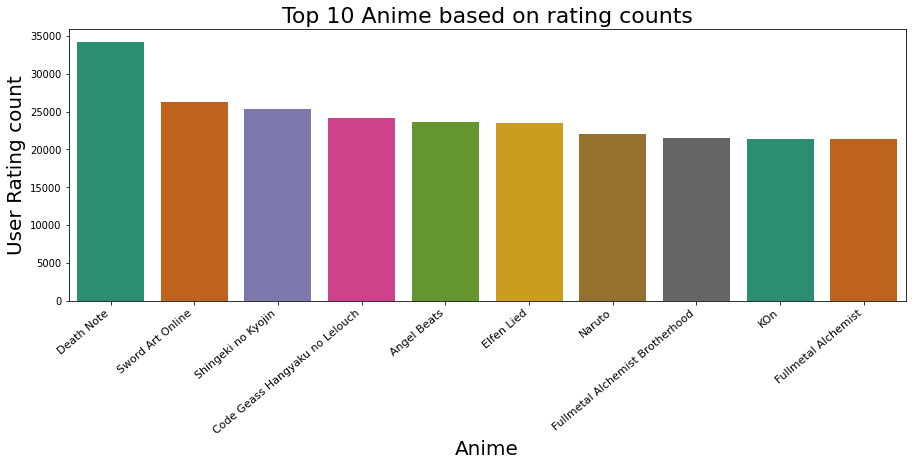

In [ ]:
top10_animerating=anime_rating_count[['name', 'totalRatingCount']].sort_values(by = 'totalRatingCount',ascending = False).head(10)
plt.figure(figsize=(15,5))
ax=sns.barplot(x="name", y="totalRatingCount", data=top10_animerating, palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 Anime based on rating counts',fontsize = 22)
ax.set_xlabel('Anime',fontsize = 20) 
ax.set_ylabel('User Rating count', fontsize = 20)

From the graph I can infer:
    
Based on the user rating I can see that`Death Note` have been rated the most folloId by `Sword Art Online` and `Shingeki no Kyojin`.

**Top 10 animes based on community size**

In [ ]:
anime_rating_data=anime_rating.merge(anime_rating_count, left_on = 'name', right_on = 'name', how = 'left')
anime_rating_data.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5.000000,1961
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10.000000,1961
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10.000000,1961
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10.000000,1961
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,322,10.000000,1961


In [ ]:
anime_rating_data.duplicated(subset=['name']).sum()

6327268

In [ ]:
anime1=anime_rating_data.drop_duplicates(subset=['name'])
anime1.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5.000000,1961
1961,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",TV,64,9.260000,793665,3,10.000000,21494
23455,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.250000,114262,43,10.000000,1188
24643,9253,SteinsGate,"Sci-Fi, Thriller",TV,24,9.170000,673572,5,9.000000,17151
41794,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.160000,151266,5,9.000000,3115


Text(0, 0.5, 'Community Size')

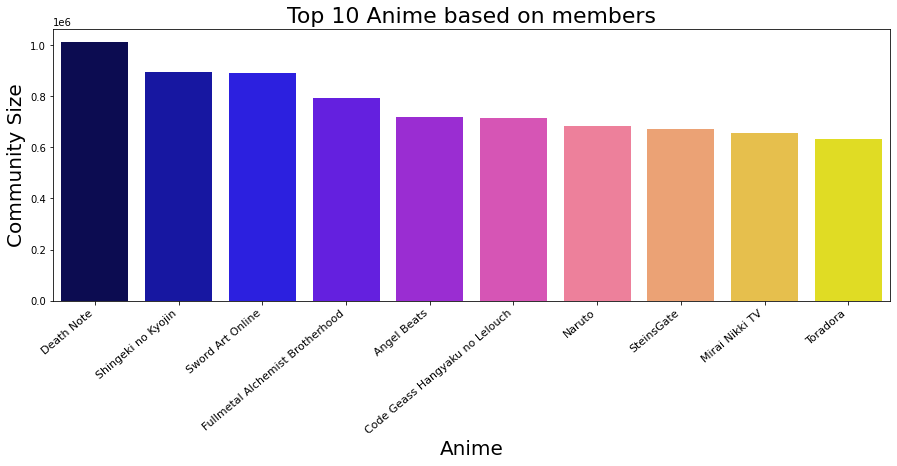

In [ ]:
top10_animemembers=anime1[['name', 'members']].sort_values(by = 'members',ascending = False).head(10)
plt.figure(figsize=(15,5))
ax=sns.barplot(x="name", y="members", data=top10_animemembers, palette="gnuplot2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 Anime based on members',fontsize = 22)
ax.set_xlabel('Anime',fontsize = 20) 
ax.set_ylabel('Community Size', fontsize = 20)

**Interpretation:**
    
`Death Note` as the huge community size folloId by `Shingeki no kyojin` and `Sword Art Online`.

### Distribution of rating <a id='analyze_tar_var'></a>

Text(0.5, 1.0, 'Rating of users')

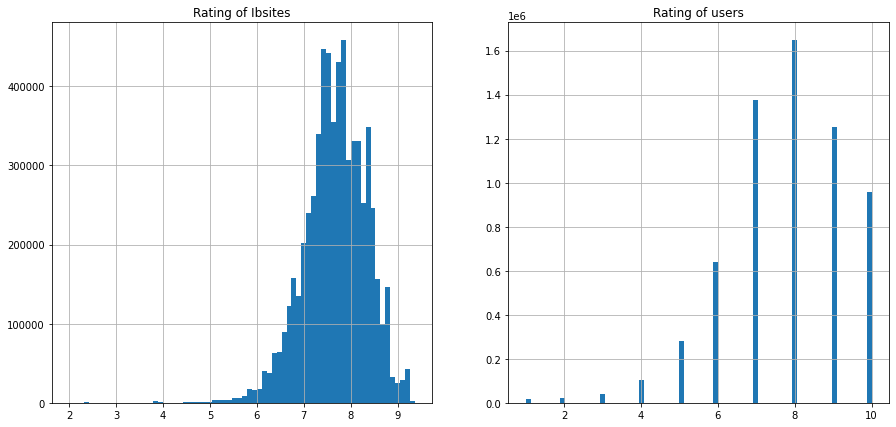

In [ ]:
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
anime_rating['avg_rating'].hist(bins=70)
plt.title("Rating of Ibsites")
plt.subplot(1,2,2)
anime_rating['user_rating'].hist(bins=70)
plt.title("Rating of users")

**Interpretation:**

Most of the ratings are spread betIen 6-10.

The mode of the distribution is around 7.5-8.0.

Both the distribution are left skeId.

**Percentage of users in each type**

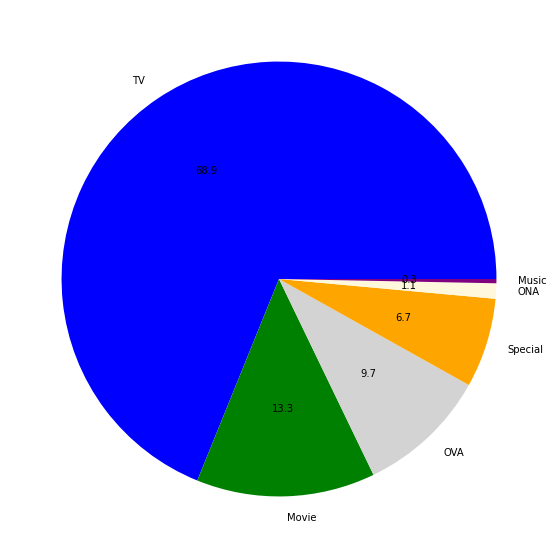

In [ ]:
labels = anime_rating['type'].value_counts().index
values = anime_rating['type'].value_counts().values
plt.figure(figsize=(10,10))
plt.pie(x=values,labels=labels,autopct='%.1f',colors=['blue','green','lightgrey','orange','Cornsilk','purple'])
plt.show()

**Understanding:**

Tv anime is watched the most followed by movies.

#Recommendation system <a id='rec_sys'></a>

##Popularity Based recommendation system <a id='pop'></a>

In [ ]:
anime_rating_data.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5.000000,1961
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10.000000,1961
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10.000000,1961
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10.000000,1961
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,322,10.000000,1961


In [ ]:
rating1=anime_rating_data[['anime_id','name','genre','avg_rating','totalRatingCount']]
rating1.drop_duplicates(subset=['anime_id'],inplace=True)
rating1.reset_index(drop=True,inplace=True)
rating1.head()

,anime_id,name,genre,avg_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",9.370000,1961
1,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",9.260000,21494
2,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",9.250000,1188
3,9253,SteinsGate,"Sci-Fi, Thriller",9.170000,17151
4,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",9.160000,3115


In [ ]:
def con_recc(df):
  print("min ratings-count")
  min_count= int(input())
  print("min rating")
  min_rating= int(input())
  dfc = df.copy()
  dfc = dfc.loc[(dfc['avg_rating']>=min_rating) & (dfc['totalRatingCount']>=min_count)]
  # mean rating across all the animes
  return dfc



In [ ]:
rating1.shape

(9890, 5)

In [ ]:
# mean rating across all the animes
C = rating1['avg_rating'].mean()
# animes having total rate count greater than 85%
m = rating1['totalRatingCount'].quantile(0.85)
print('m: ', m, 'C: ', C)

m:  987.6499999999996 C:  6.592642062689574


In [ ]:
def Iighted_rating(x, m=m, C=C):
    v = x['totalRatingCount']
    R = x['avg_rating']
    return (v/(v+m) * R) + (m/(m+v) * C)

In [ ]:
# animes having total rate count greater than 85% is considered into lists_animes
lists_animes =rating1.copy().loc[rating1['totalRatingCount'] >= m]
lists_animes.shape

(1484, 5)

In [ ]:
lists_animes.head()

,anime_id,name,genre,avg_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",9.370000,1961
1,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",9.260000,21494
2,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",9.250000,1188
3,9253,SteinsGate,"Sci-Fi, Thriller",9.170000,17151
4,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",9.160000,3115


In [ ]:
lists_animes=con_recc(lists_animes)

min ratings-count
1200
min rating
9


In [ ]:
lists_animes.head()

,anime_id,name,genre,avg_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",9.370000,1961
1,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",9.260000,21494
3,9253,SteinsGate,"Sci-Fi, Thriller",9.170000,17151
4,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",9.160000,3115
6,11061,Hunter x Hunter 2011,"Action, Adventure, Shounen, Super Power",9.130000,7477


In [ ]:
# Define a new feature 'score' and calculate its value with `Iighted_rating()`
lists_animes['score'] = lists_animes.apply(Iighted_rating, axis=1)

In [ ]:
lists_animes.head()

,anime_id,name,genre,avg_rating,totalRatingCount,score
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",9.370000,1961,8.439724
1,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",9.260000,21494,9.142819
3,9253,SteinsGate,"Sci-Fi, Thriller",9.170000,17151,9.029663
4,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",9.160000,3115,8.541948
6,11061,Hunter x Hunter 2011,"Action, Adventure, Shounen, Super Power",9.130000,7477,8.833943


In [ ]:
#Sort movies based on score calculated above
lists_animes = lists_animes.sort_values('score', ascending=False)
#Print the top 10 movies
lists_animes[['name', 'totalRatingCount', 'avg_rating', 'score']].head(10)

,name,totalRatingCount,avg_rating,score
1,Fullmetal Alchemist Brotherhood,21494,9.260000,9.142819
3,SteinsGate,17151,9.170000,9.029663
10,Clannad After Story,15518,9.060000,8.912360
6,Hunter x Hunter 2011,7477,9.130000,8.833943
12,Gintama,4264,9.040000,8.579738
4,Gintama039,3115,9.160000,8.541948
0,Kimi no Na wa,1961,9.370000,8.439724
9,Gintama039 Enchousen,2126,9.110000,8.311494
8,Gintama Movie Kanketsuhen Yorozuya yo Eien Nare,2147,9.100000,8.309994


The above plot shows top 10 animes which can be recommended based on trend.

##Forming the similarity index <a id='content'></a>

In [ ]:
data=anime.copy()
# considering the anime content
data['describe']=data['genre']+data['type']+data['episodes']
data['describe'].fillna(' ')
data.head()

,anime_id,name,genre,type,episodes,rating,members,describe
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,"Drama, Romance, School, SupernaturalMovie1"
1,5114,Fullmetal Alchemist Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",TV,64,9.260000,793665,"Action, Adventure, Drama, Fantasy, Magic, Mili..."
2,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.250000,114262,"Action, Comedy, Historical, Parody, Samurai, S..."
3,9253,SteinsGate,"Sci-Fi, Thriller",TV,24,9.170000,673572,"Sci-Fi, ThrillerTV24"
4,9969,Gintama039,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.160000,151266,"Action, Comedy, Historical, Parody, Samurai, S..."


In [ ]:
data.drop_duplicates(subset=['name'],inplace=True)

In [ ]:
data.shape

(11806, 8)

In [ ]:
data.reset_index(drop=True,inplace=True)

In [ ]:
tf = TfidfVectorizer(ngram_range=(1,2), stop_words='english')
tf_matrix = tf.fit_transform(data['describe'])
tf_matrix.shape

(11806, 5383)

In [ ]:
simil = linear_kernel(tf_matrix, tf_matrix)
simil.shape

(11806, 11806)

In [ ]:
id=data['anime_id'].values
simil = pd.DataFrame(simil, index=id, columns=id)
simil.columns = data['name']
simil['anime_name'] = data['name'].values

In [ ]:
simil.head()

name,Kimi no Na wa,Fullmetal Alchemist Brotherhood,Gintama°,SteinsGate,Gintama039,Haikyuu Karasuno Koukou VS Shiratorizawa Gakuen Koukou,Hunter x Hunter 2011,Ginga Eiyuu Densetsu,Gintama Movie Kanketsuhen Yorozuya yo Eien Nare,Gintama039 Enchousen,Clannad After Story,Koe no Katachi,Gintama,Code Geass Hangyaku no Lelouch R2,Haikyuu Second Season,Sen to Chihiro no Kamikakushi,Shigatsu wa Kimi no Uso,Mushishi Zoku Shou 2nd Season,Ookami Kodomo no Ame to Yuki,Code Geass Hangyaku no Lelouch,Hajime no Ippo,Rurouni Kenshin Meiji Kenkaku Romantan Tsuiokuhen,Cowboy Bebop,One Punch Man,Mononoke Hime,Suzumiya Haruhi no Shoushitsu,Monogatari Series Second Season,Mushishi Zoku Shou,Mushishi,Tengen Toppa Gurren Lagann,Great Teacher Onizuka,Natsume Yuujinchou Go,Hajime no Ippo New Challenger,Mushishi Zoku Shou Suzu no Shizuku,Natsume Yuujinchou Shi,Howl no Ugoku Shiro,FateZero 2nd Season,Kizumonogatari II Nekketsuhen,Monster,Bakuman 3rd Season,Death Note,Gintama° Aizome Kaorihen,Ansatsu Kyoushitsu TV 2nd Season,Haikyuu,Hajime no Ippo Rising,Kara no Kyoukai 5 Mujun Rasen,Natsume Yuujinchou San,Ping Pong The Animation,Mushishi Special Hihamukage,Boku dake ga Inai Machi,Yojouhan Shinwa Taikei,Aria The Origination,Kamisama Hajimemashita Kakohen,Rainbow Nisha Rokubou no Shichinin,ReZero kara Hajimeru Isekai Seikatsu,Tengen Toppa Gurren Lagann Movie Lagannhen,Zoku Natsume Yuujinchou,Ano Hi Mita Hana no Namae wo Bokutachi wa Mada Shiranai,Kuroko no Basket 3rd Season,SteinsGate Movie Fuka Ryouiki no Déjà vu,Hotarubi no Mori e,Shokugeki no Souma,Yuri on Ice,Gintama Yorinuki Gintamasan on Theater 2D,JoJo no Kimyou na Bouken Stardust Crusaders 2nd Season,Gintama Movie Shinyaku Benizakurahen,Hellsing Ultimate,Kiseijuu Sei no Kakuritsu,Shouwa Genroku Rakugo Shinjuu,Uchuu Kyoudai,Bakemono no Ko,Hotaru no Haka,Kuroko no Basket 2nd Season,Major S5,Ghost in the Shell Stand Alone Complex 2nd GIG,JoJo no Kimyou na Bouken Diamond wa Kudakenai,Kara no Kyoukai 7 Satsujin Kousatsu Kou,Kingdom 2nd Season,Slam Dunk,Usagi Drop,Girls und Panzer der Film,Mob Psycho 100,Nana,Baccano,Mushishi Zoku Shou Odoro no Michi,Shingeki no Kyojin,Bakuman 2nd Season,Cross Game,Doukyuusei Movie,Evangelion 20 You Can Not Advance,Shinsekai yori,Uchuu Senkan Yamato 2199,Chihayafuru 2,FateZero,JoJo no Kimyou na Bouken TV,Mahou Shoujo Madoka★Magica,Nichijou,PsychoPass,Barakamon,Diamond no Ace Second Season,Magi The Kingdom of Magic,Mahou Shoujo Madoka★Magica Movie 3 Hangyaku no Monogatari,Major World Series,Samurai Champloo,Shokugeki no Souma Ni no Sara,Katanagatari,Mahou Shoujo Madoka★Magica Movie 2 Eien no Monogatari,Major S6,Mononoke,Shirobako,Ashita no Joe 2,Hunter x Hunter,Noragami Aragoto,Sakamichi no Apollon,Tonari no Totoro,Ghost in the Shell Stand Alone Complex,Kaze no Tani no Nausicaä,No Game No Life,Romeo no Aoi Sora,Yuu☆Yuu☆Hakusho,Kino no Tabi The Beautiful World,Kuroko no Basket,Nodame Cantabile,Ookami to Koushinryou II,Shingeki no Kyojin Kuinaki Sentaku,SteinsGate Oukoubakko no Poriomania,Fatestay night Unlimited Blade Works 2nd Season,Kemono no Souja Erin,Kizumonogatari I Tekketsuhen,Neon Genesis Evangelion The End of Evangelion,Toradora,Toki wo Kakeru Shoujo,Tsubasa Tokyo Revelations,Owarimonogatari,Rurouni Kenshin Meiji Kenkaku Romantan,Stranger Mukou Hadan,Detective Conan Movie 06 The Phantom of Baker Street,Fatestay night Unlimited Blade Works,Major S1,Mobile Suit Gundam The Origin,Nanatsu no Taizai,Natsume Yuujinchou,One Piece Film Strong World,Higurashi no Naku Koro ni Kai,Hunter x Hunter OVA,Hunter x Hunter Greed Island Final,Kuroshitsuji Book of Murder,Major S2,One Outs,Beck,Berserk,Cowboy Bebop Tengoku no Tobira,Major S3,Mobile Suit Gundam Unicorn,Natsume Yuujinchou Itsuka Yuki no Hi ni,NHK ni Youkoso,Rose of Versailles,Sakurasou no Pet na Kanojo,Angel Beats,Bakemonogatari,Bungou Stray Dogs 2nd Season,Hajime no Ippo Champion Road,One Piece Film Z,Ouran Koukou Host Club,Detective Conan Movie 13 The Raven Chaser,Durarara,Nodame Cantabile Finale,Planetes,Shelter,Tenk

In [ ]:
anime_rating.shape

(6337137, 9)

In [ ]:
anime_rating.duplicated(subset=['user_id','name']).sum()

31779

In [ ]:
anime_rating1=anime_rating.copy()
anime_rating1.drop_duplicates(subset=['user_id','name'],inplace=True)

In [ ]:
anime_rating1.reset_index(drop=True,inplace=True)

In [ ]:
counts = anime_rating1['user_id'].value_counts()
anime_feature = anime_rating1[anime_rating1['user_id'].isin(counts[counts >= 500].index)]

In [ ]:
anime_feature.shape

(989534, 9)

In [ ]:
# user-item matrix
anime_rating_pivot = anime_feature.pivot(index='name', columns='user_id', values='user_rating')
anime_rating_pivot = anime_rating_pivot.fillna(0)
anime_rating_pivot.head()

user_id         226      271      294      392      446      478      661    \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         741      771      786      958      1019     1145     1176   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         1191     1287     1344     1456     1497     1504     1522   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         8.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         1530     1720     1822     1984     2200     2273     2297   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         2378     2632     2695     2701     2810     2820     2951   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         3040     3117     3124     3127     3193     3203     3476   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         3500     3557     3569     3597     3657     4064     4102   \
name                                                                          
0            0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0008         0.000000 0.000000 4.000000 0.000000 0.000000 0.000000 0.000000   
001          0.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
009 ReCyborg 0.000000 7.000000 0.000000 0.000000 0.000000 0.000000 0.000000   
0091         5.000000 0.000000 0.000000 0.000000 0.000000 0.000000 0.000000   

user_id         4177     4215     4350     4468     4512     4749     4759   \
name                                       

In [ ]:
anime_rating_pivot.shape

(9539, 1345)

##Model based Recommendation System(Surprise) <a id='model'></a>

In [ ]:
anime_rating_data.head()

,anime_id,name,genre,type,episodes,avg_rating,members,user_id,user_rating,totalRatingCount
0,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,99,5.000000,1961
1,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,152,10.000000,1961
2,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,244,10.000000,1961
3,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,271,10.000000,1961
4,32281,Kimi no Na wa,"Drama, Romance, School, Supernatural",Movie,1,9.370000,200630,322,10.000000,1961


In [ ]:
counts = anime_rating_data['user_id'].value_counts()
# considering only users who have watched more than 1500 animes
anime_feature1 = anime_rating_data[anime_rating_data['user_id'].isin(counts[counts >= 1500].index)]

In [ ]:
anime_feature1.shape

(67779, 10)

In [ ]:
anime_feature1.user_rating.value_counts()

7.000000     19021
8.000000     14593
6.000000     12185
5.000000      7457
9.000000      6364
10.000000     3082
4.000000      2702
3.000000      1531
2.000000       603
1.000000       241
Name: user_rating, dtype: int64

In [ ]:
reader = Reader(rating_scale=(1.0,10.0))
data1 = Dataset.load_from_df(anime_feature[['user_id', 'name', 'user_rating']], reader)

In [ ]:
svd = SVD()
cross_validate(svd, data1, measures=['rmse'], cv=3, return_train_measures=True)

{'fit_time': (44.5856728553772, 43.817007303237915, 44.54569673538208),
 'test_rmse': array([1.14055964, 1.14401357, 1.14084983]),
 'test_time': (4.60130500793457, 3.5747673511505127, 4.550715923309326),
 'train_rmse': array([0.71246215, 0.71432963, 0.71223192])}

In [ ]:
trainset = data1.build_full_trainset()
svd.fit(trainset)

In [ ]:
items = anime_feature['name'].unique()
test = [[13954.0, iid, 8] for iid in items]
predictions = svd.test(test)
pred = pd.DataFrame(predictions)

In [ ]:
pred.sort_values(by='est', ascending=False).head(10)

,uid,iid,r_ui,est,details
6,13954.000000,Hunter x Hunter 2011,8,9.515968,{'was_impossible': False}
8,13954.000000,Gintama Movie Kanketsuhen Yorozuya yo Eien Nare,8,9.138524,{'was_impossible': False}
2,13954.000000,Gintama°,8,9.081028,{'was_impossible': False}
1,13954.000000,Fullmetal Alchemist Brotherhood,8,9.066977,{'was_impossible': False}
12,13954.000000,Gintama,8,8.937066,{'was_impossible': False}
4,13954.000000,Gintama039,8,8.858837,{'was_impossible': False}
43,13954.000000,Hajime no Ippo Rising,8,8.681481,{'was_impossible': False}
82,13954.000000,Shingeki no Kyojin,8,8.676371,{'was_impossible': False}
20,13954.000000,Hajime no Ippo,8,8.655493,{'was_impossible': False}
350,13954.000000,Gintama Jump Festa 2015 Special,8,8.618456,{'was_impossible': False}


The above output are the predicted rating that a user may give for the respective animes. 

##Hybrid Recommendation System <a id='hybrid'></a>

In [ ]:
md2 = anime[['anime_id', 'name']]

In [ ]:
simil.head(2)

name,Kimi no Na wa,Fullmetal Alchemist Brotherhood,Gintama°,SteinsGate,Gintama039,Haikyuu Karasuno Koukou VS Shiratorizawa Gakuen Koukou,Hunter x Hunter 2011,Ginga Eiyuu Densetsu,Gintama Movie Kanketsuhen Yorozuya yo Eien Nare,Gintama039 Enchousen,Clannad After Story,Koe no Katachi,Gintama,Code Geass Hangyaku no Lelouch R2,Haikyuu Second Season,Sen to Chihiro no Kamikakushi,Shigatsu wa Kimi no Uso,Mushishi Zoku Shou 2nd Season,Ookami Kodomo no Ame to Yuki,Code Geass Hangyaku no Lelouch,Hajime no Ippo,Rurouni Kenshin Meiji Kenkaku Romantan Tsuiokuhen,Cowboy Bebop,One Punch Man,Mononoke Hime,Suzumiya Haruhi no Shoushitsu,Monogatari Series Second Season,Mushishi Zoku Shou,Mushishi,Tengen Toppa Gurren Lagann,Great Teacher Onizuka,Natsume Yuujinchou Go,Hajime no Ippo New Challenger,Mushishi Zoku Shou Suzu no Shizuku,Natsume Yuujinchou Shi,Howl no Ugoku Shiro,FateZero 2nd Season,Kizumonogatari II Nekketsuhen,Monster,Bakuman 3rd Season,Death Note,Gintama° Aizome Kaorihen,Ansatsu Kyoushitsu TV 2nd Season,Haikyuu,Hajime no Ippo Rising,Kara no Kyoukai 5 Mujun Rasen,Natsume Yuujinchou San,Ping Pong The Animation,Mushishi Special Hihamukage,Boku dake ga Inai Machi,Yojouhan Shinwa Taikei,Aria The Origination,Kamisama Hajimemashita Kakohen,Rainbow Nisha Rokubou no Shichinin,ReZero kara Hajimeru Isekai Seikatsu,Tengen Toppa Gurren Lagann Movie Lagannhen,Zoku Natsume Yuujinchou,Ano Hi Mita Hana no Namae wo Bokutachi wa Mada Shiranai,Kuroko no Basket 3rd Season,SteinsGate Movie Fuka Ryouiki no Déjà vu,Hotarubi no Mori e,Shokugeki no Souma,Yuri on Ice,Gintama Yorinuki Gintamasan on Theater 2D,JoJo no Kimyou na Bouken Stardust Crusaders 2nd Season,Gintama Movie Shinyaku Benizakurahen,Hellsing Ultimate,Kiseijuu Sei no Kakuritsu,Shouwa Genroku Rakugo Shinjuu,Uchuu Kyoudai,Bakemono no Ko,Hotaru no Haka,Kuroko no Basket 2nd Season,Major S5,Ghost in the Shell Stand Alone Complex 2nd GIG,JoJo no Kimyou na Bouken Diamond wa Kudakenai,Kara no Kyoukai 7 Satsujin Kousatsu Kou,Kingdom 2nd Season,Slam Dunk,Usagi Drop,Girls und Panzer der Film,Mob Psycho 100,Nana,Baccano,Mushishi Zoku Shou Odoro no Michi,Shingeki no Kyojin,Bakuman 2nd Season,Cross Game,Doukyuusei Movie,Evangelion 20 You Can Not Advance,Shinsekai yori,Uchuu Senkan Yamato 2199,Chihayafuru 2,FateZero,JoJo no Kimyou na Bouken TV,Mahou Shoujo Madoka★Magica,Nichijou,PsychoPass,Barakamon,Diamond no Ace Second Season,Magi The Kingdom of Magic,Mahou Shoujo Madoka★Magica Movie 3 Hangyaku no Monogatari,Major World Series,Samurai Champloo,Shokugeki no Souma Ni no Sara,Katanagatari,Mahou Shoujo Madoka★Magica Movie 2 Eien no Monogatari,Major S6,Mononoke,Shirobako,Ashita no Joe 2,Hunter x Hunter,Noragami Aragoto,Sakamichi no Apollon,Tonari no Totoro,Ghost in the Shell Stand Alone Complex,Kaze no Tani no Nausicaä,No Game No Life,Romeo no Aoi Sora,Yuu☆Yuu☆Hakusho,Kino no Tabi The Beautiful World,Kuroko no Basket,Nodame Cantabile,Ookami to Koushinryou II,Shingeki no Kyojin Kuinaki Sentaku,SteinsGate Oukoubakko no Poriomania,Fatestay night Unlimited Blade Works 2nd Season,Kemono no Souja Erin,Kizumonogatari I Tekketsuhen,Neon Genesis Evangelion The End of Evangelion,Toradora,Toki wo Kakeru Shoujo,Tsubasa Tokyo Revelations,Owarimonogatari,Rurouni Kenshin Meiji Kenkaku Romantan,Stranger Mukou Hadan,Detective Conan Movie 06 The Phantom of Baker Street,Fatestay night Unlimited Blade Works,Major S1,Mobile Suit Gundam The Origin,Nanatsu no Taizai,Natsume Yuujinchou,One Piece Film Strong World,Higurashi no Naku Koro ni Kai,Hunter x Hunter OVA,Hunter x Hunter Greed Island Final,Kuroshitsuji Book of Murder,Major S2,One Outs,Beck,Berserk,Cowboy Bebop Tengoku no Tobira,Major S3,Mobile Suit Gundam Unicorn,Natsume Yuujinchou Itsuka Yuki no Hi ni,NHK ni Youkoso,Rose of Versailles,Sakurasou no Pet na Kanojo,Angel Beats,Bakemonogatari,Bungou Stray Dogs 2nd Season,Hajime no Ippo Champion Road,One Piece Film Z,Ouran Koukou Host Club,Detective Conan Movie 13 The Raven Chaser,Durarara,Nodame Cantabile Finale,Planetes,Shelter,Tenk

In [ ]:
# pre defined function to predict the user rating of similar animes where I pass the anime name along with the user id as parameters
def hybrid_rec(ttl, userid):
    idx = simil[simil['anime_name']==ttl]
    idx = idx.drop('anime_name', axis=1).T
    idx.columns = ['values']
    idx['id'] = simil.index
    # considering only top 25 similar animes
    idx = idx.sort_values(by='values', ascending=False).head(25)
    items = idx['id'].unique()
    test = [[userid, iid, 8] for iid in items]
    predictions = svd.test(test)
    pred = pd.DataFrame(predictions)
    pred = pred.merge(md2, left_on='iid', right_on='anime_id')
    pred = pred.sort_values(by='est', ascending=False)
    return pred

In [ ]:
hybrid_rec('Death Note',13954.0)

,uid,iid,r_ui,est,details,anime_id,name
0,13954.000000,1535,8,5.394963,{'was_impossible': False},1535,Death Note
13,13954.000000,17187,8,5.394963,{'was_impossible': False},17187,Ghost in the Shell Arise Border1 Ghost Pain
23,13954.000000,28479,8,5.394963,{'was_impossible': False},28479,Detective Conan Movie 19 The Hellfire Sunflowers
22,13954.000000,5460,8,5.394963,{'was_impossible': False},5460,Detective Conan Movie 13 The Raven Chaser
21,13954.000000,6467,8,5.394963,{'was_impossible': False},6467,Detective Conan Movie 14 The Lost Ship in the Sky
20,13954.000000,29837,8,5.394963,{'was_impossible': False},29837,Yakushiji Ryouko no Kaiki Jikenbo Hamachou Voi...
19,13954.000000,3614,8,5.394963,{'was_impossible': False},3614,Yakushiji Ryouko no Kaiki Jikenbo
18,13954.000000,468,8,5.394963,{'was_impossible': False},468,Ghost in the Shell 2 Innocence
17,13954.000000,1346,8,5.394963,{'was_impossible': False},1346,AD Police
16,13954.000000,27411,8,5.394963,{'was_impossible': False},27411,Ghost in the Shell 2015


These are the top 25 animes similar to the `Death Note` and the estimated rating that the user `13954` will allocate.